In [5]:
%config Completer.use_jedi = False

# Problem set 1 : Seeing in Color

#  PROBLEM 1 : color alignment

In [3]:
# setting up the environment

import numpy as np
import cv2  # if you don't have it, you can install it in anaconda prompt: pip install opencv-python
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import scipy
import scipy.ndimage
from imageio import imread, imsave
%matplotlib inline

In [70]:
import copy

Image size: 370 x 370


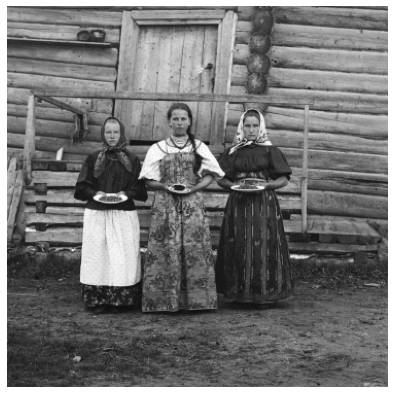

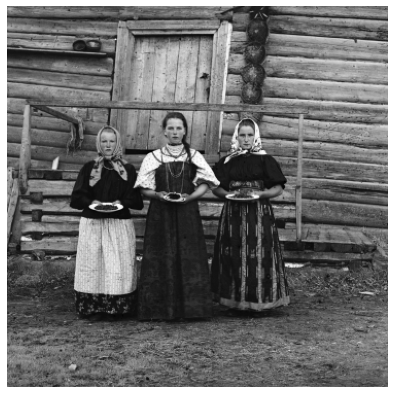

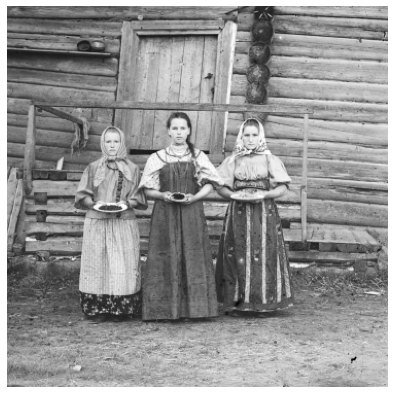

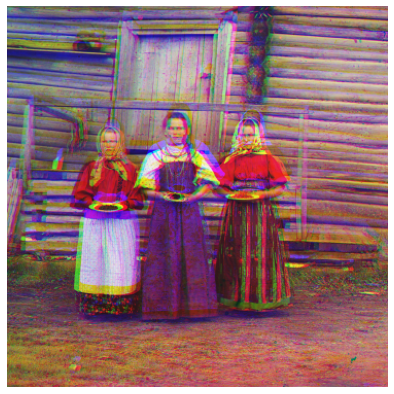

In [4]:
# reading the three color channels, and displaying them (as way as the default alignment)
red = np.array(imread('images/prokudin-girls-red.ppm',as_gray=True)/255.0)
blue = np.array(imread('images/prokudin-girls-blue.ppm',as_gray=True)/255.0)
green = np.array(imread('images/prokudin-girls-green.ppm',as_gray=True)/255.0)

print('Image size: %d x %d'% (blue.shape[0],blue.shape[1]))

# right figure size will make sure the images are displayed well, without too much aliasing or blur
plt.figure(figsize=(14,7))
plt.axis('off')
plt.imshow(blue, cmap='gray')

plt.figure(figsize=(14,7))
plt.axis('off')
plt.imshow(green, cmap='gray')

plt.figure(figsize=(14,7))
plt.axis('off')
plt.imshow(red, cmap='gray')

# now try to just superimpose the three channels; you will see significant color artifacts due to misalignment
color=np.dstack((red,green,blue))
plt.figure(figsize=(14,7))
plt.axis('off')
plt.imshow(color)

Now go ahead: implement the code for searching for the optimal alignment, and test it first on the test_image where you can introduce "synthetic" shifts, and make sure you recover from them; and then the Prokudin-Gorskii image we used above, as well as the other triplet provided (the rock image), and any additonal triplets if you would like.

## 1.1.1 Naive Stacking


In [122]:
test_image = np.array(imread('images/test-image.png')/255.0)

In [123]:
test_image.shape

(207, 384, 3)

In [124]:
padded_test_image = np.pad(test_image,((15,15),(15,15),(0,0)), 'constant', constant_values=(0))

In [74]:
original_padded_image = copy.deepcopy(padded_test_image)
padded_test_image[:,:,0] = np.roll(padded_test_image[:,:,0],[-2,-5],axis = [0,1])
padded_test_image[:,:,1] = np.roll(padded_test_image[:,:,1],[2,5], axis = [0,1])

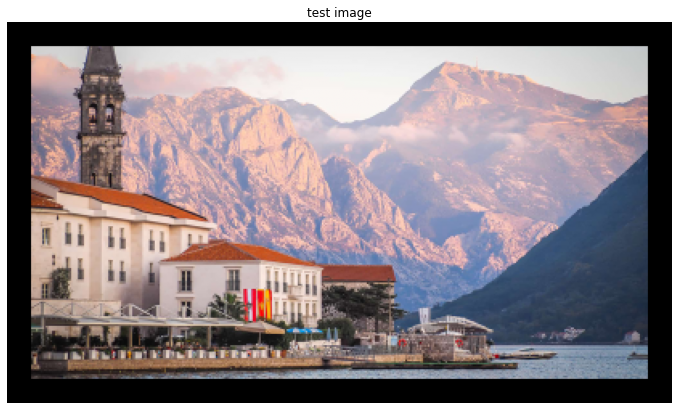

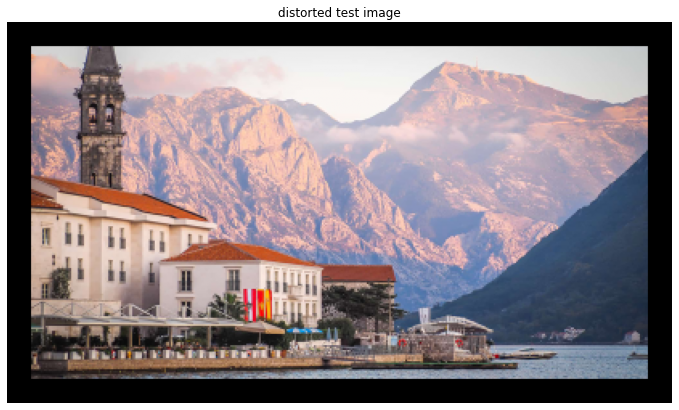

In [381]:
plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("test image")
plt.imshow(original_padded_image)

plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("distorted test image")
plt.imshow(padded_test_image)

## 1.1.2 SSD

In [382]:
r = padded_test_image[:,:,0]
g = padded_test_image[:,:,1]
b = padded_test_image[:,:,2]
diff_matrix = np.zeros([31,31,2])
for i in range(-15,16,1):
    for j in range(-15,16,1):
        diff_matrix[i+15,j+15,0] = ((b - np.roll(r,[i,j],axis =[0,1]))**2).sum()
        diff_matrix[i+15,j+15,1] = ((b - np.roll(g,[i,j],axis =[0,1]))**2).sum()

In [384]:
ind_r = np.unravel_index(np.argmin(diff_matrix[:,:,0], axis=None), diff_matrix[:,:,0].shape)

ind_g = np.unravel_index(np.argmin(diff_matrix[:,:,1], axis=None), diff_matrix[:,:,1].shape)

In [385]:
ind_r = np.array(ind_r) -15
ind_g = np.array(ind_g) - 15

In [386]:
reconstructed_test_image = copy.deepcopy(padded_test_image)
reconstructed_test_image[:,:,0] = np.roll(padded_test_image[:,:,0],ind_r,axis = [0,1])
reconstructed_test_image[:,:,1] = np.roll(padded_test_image[:,:,1],ind_g, axis = [0,1])

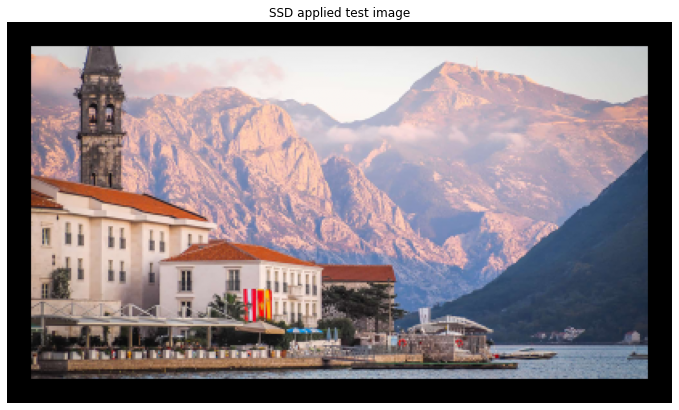

In [387]:
plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("SSD applied test image")
plt.imshow(reconstructed_test_image)

## 1.1.3 NCC

In [388]:
r = padded_test_image[:,:,0]
g = padded_test_image[:,:,1]
b = padded_test_image[:,:,2]
sim_matrix = np.zeros([31,31,2])
for i in range(-15,16,1):
    for j in range(-15,16,1):
        sim_matrix[i+15,j+15,0] = ((b * np.roll(r,[i,j],axis =[0,1]))).sum()/(np.linalg.norm(b)*np.linalg.norm(r))
        sim_matrix[i+15,j+15,1] = ((b * np.roll(g,[i,j],axis =[0,1]))).sum()/(np.linalg.norm(b)*np.linalg.norm(g))

In [389]:
ind_r = np.unravel_index(np.argmax(sim_matrix[:,:,0], axis=None), sim_matrix[:,:,0].shape)

ind_g = np.unravel_index(np.argmax(sim_matrix[:,:,1], axis=None), sim_matrix[:,:,1].shape)

In [390]:
ind_r = np.array(ind_r) -15
ind_g = np.array(ind_g) - 15

In [391]:
reconstructed_test_image_ncc = copy.deepcopy(padded_test_image)
reconstructed_test_image_ncc[:,:,0] = np.roll(padded_test_image[:,:,0],ind_r,axis = [0,1])
reconstructed_test_image_ncc[:,:,1] = np.roll(padded_test_image[:,:,1],ind_g, axis = [0,1])

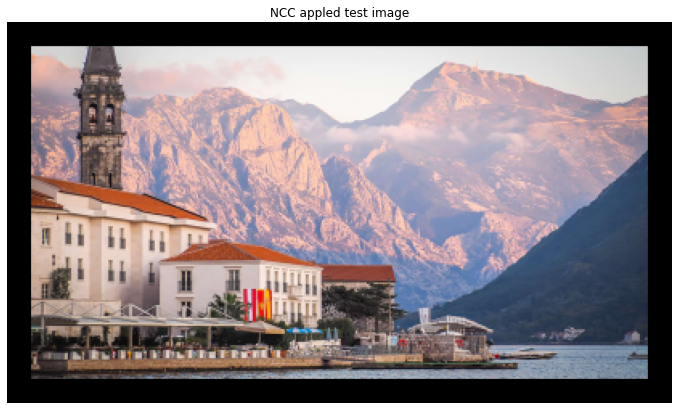

In [392]:
plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("NCC appled test image")
plt.imshow(reconstructed_test_image_ncc)

For quantitatively assess the results, do 2d correlation of two pictures. Since the two pictures are the same size, it can reduced the form to: 
$\sum_{i,j}{A_{i,j} * B_{i,j}}$

while A is the clean image, B is the reconstructed image, i,j is the index of the pixle. The dot product between $A_{i,j}$ and $B_{i,j}$. The highest the value means more similar

## 1.2 Real Data

In [393]:
def img_2d_pad (input_img, pad_length):
    return np.pad(input_img,((pad_length,pad_length),(pad_length,pad_length)), 'constant', constant_values=(0))

In [394]:
def naive_stacking(img_list):
    return np.dstack(img_list)

In [395]:
def NCC(padded_img_lst, pad_length):
    r = padded_img_lst[0]
    g = padded_img_lst[1]
    b = padded_img_lst[2]
    sim_matrix = np.zeros([pad_length*2+1,pad_length*2+1,2])
    for i in range(-pad_length,pad_length+1,1):
        for j in range(-pad_length,pad_length,1):
            sim_matrix[i+pad_length,j+pad_length,0] = ((b * np.roll(r,[i,j],axis =[0,1]))).sum()/(np.linalg.norm(b)*np.linalg.norm(r))
            sim_matrix[i+pad_length,j+pad_length,1] = ((b * np.roll(g,[i,j],axis =[0,1]))).sum()/(np.linalg.norm(b)*np.linalg.norm(g))
    ind_r = np.unravel_index(np.argmax(sim_matrix[:,:,0], axis=None), sim_matrix[:,:,0].shape)
    ind_g = np.unravel_index(np.argmax(sim_matrix[:,:,1], axis=None), sim_matrix[:,:,1].shape)
    ind_r = np.array(ind_r) - pad_length
    ind_g = np.array(ind_g) - pad_length
    
    aligned_img_lst = []
    aligned_img_lst.append(np.roll(r,ind_r,axis = [0,1]))
    aligned_img_lst.append(np.roll(g,ind_g, axis = [0,1]))
    aligned_img_lst.append(b)
    
    return aligned_img_lst

In [396]:
def SSD(padded_img_lst, pad_length):
    r = padded_img_lst[0]
    g = padded_img_lst[1]
    b = padded_img_lst[2]
    diff_matrix = np.zeros([pad_length*2+1,pad_length*2+1,2])
    for i in range(-pad_length,pad_length+1,1):
        for j in range(-pad_length,pad_length+1,1):
            diff_matrix[i+pad_length,j+pad_length,0] = ((b - np.roll(r,[i,j],axis =[0,1]))**2).sum()
            diff_matrix[i+pad_length,j+pad_length,1] = ((b - np.roll(g,[i,j],axis =[0,1]))**2).sum()

    ind_r = np.unravel_index(np.argmin(diff_matrix[:,:,0], axis=None), diff_matrix[:,:,0].shape)
    ind_g = np.unravel_index(np.argmin(diff_matrix[:,:,1], axis=None), diff_matrix[:,:,1].shape)
    ind_r = np.array(ind_r) - pad_length
    ind_g = np.array(ind_g) - pad_length
    
    aligned_img_lst = []
    aligned_img_lst.append(np.roll(r,ind_r,axis = [0,1]))
    aligned_img_lst.append(np.roll(g,ind_g, axis = [0,1]))
    aligned_img_lst.append(b)
    
    return aligned_img_lst

In [397]:
# reading the three color channels, and displaying them (as way as the default alignment)
red = np.array(imread('images/prokudin-girls-red.ppm',as_gray=True)/255.0)
blue = np.array(imread('images/prokudin-girls-blue.ppm',as_gray=True)/255.0)
green = np.array(imread('images/prokudin-girls-green.ppm',as_gray=True)/255.0)

img_lst = [red, green, blue]

In [398]:
pad_img_lst = []
for img in img_lst:
    pad_img_lst.append(img_2d_pad(img,15))

In [399]:
pad_img_lst[0].shape

(400, 400)

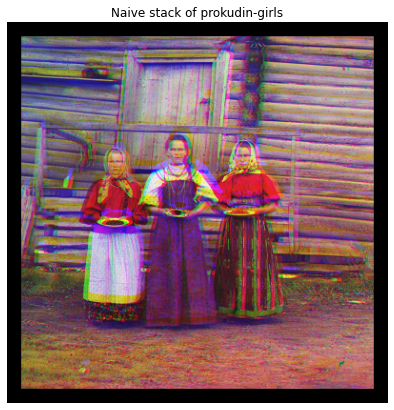

In [400]:
# now try to just superimpose the three channels; you will see significant color artifacts due to misalignment
color=naive_stacking(pad_img_lst)
plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("Naive stack of prokudin-girls")
plt.imshow(color)


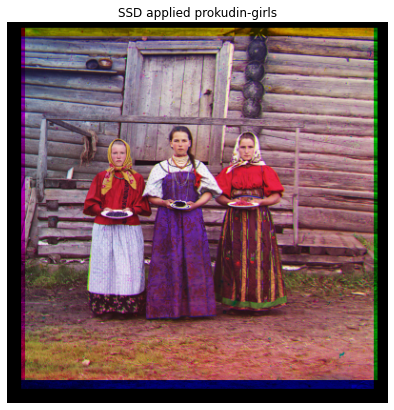

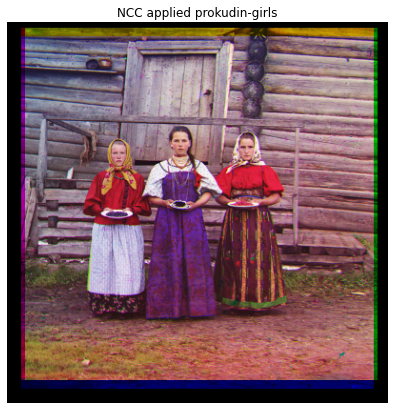

In [401]:
ssd_align_lst = SSD(pad_img_lst,15)
color_ssd = naive_stacking(ssd_align_lst)

ncc_align_lst = NCC(pad_img_lst, 15)
color_ncc = naive_stacking(ncc_align_lst)

plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("SSD applied prokudin-girls")
plt.imshow(color_ssd)

plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("NCC applied prokudin-girls")
plt.imshow(color_ncc)

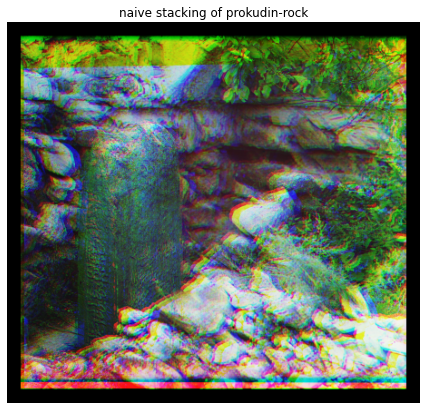

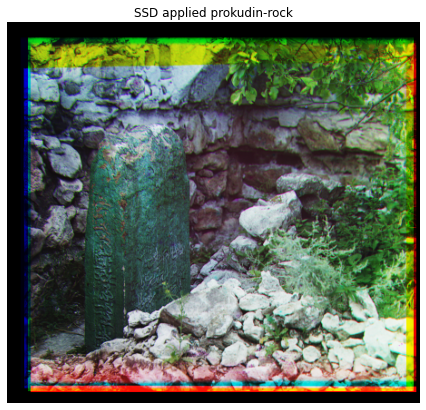

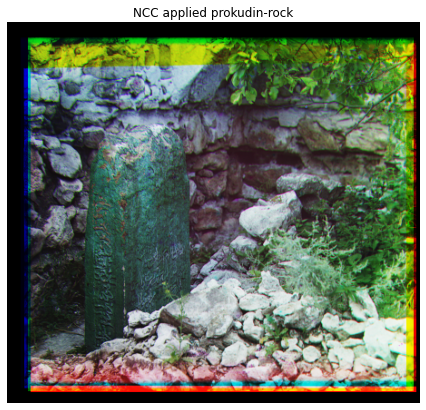

In [402]:
red = np.array(imread('images/prokudin-rock-red.ppm',as_gray=True)/255.0)
blue = np.array(imread('images/prokudin-rock-blue.ppm',as_gray=True)/255.0)
green = np.array(imread('images/prokudin-rock-green.ppm',as_gray=True)/255.0)

img_lst = [red, green, blue]

pad_img_lst = []
for img in img_lst:
    pad_img_lst.append(img_2d_pad(img,15))
    
color=naive_stacking(pad_img_lst)
plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("naive stacking of prokudin-rock")
plt.imshow(color)

ssd_align_lst = SSD(pad_img_lst,15)
color_ssd = naive_stacking(ssd_align_lst)

ncc_align_lst = NCC(pad_img_lst, 15)
color_ncc = naive_stacking(ncc_align_lst)

plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("SSD applied prokudin-rock")
plt.imshow(color_ssd)

plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("NCC applied prokudin-rock")
plt.imshow(color_ncc)

## 1.2.1 Bonus

In [403]:
red = np.array(imread('images/bonus_red.png',as_gray=True)/255.0)
blue = np.array(imread('images/bonus_blue.png',as_gray=True)/255.0)
green = np.array(imread('images/bonus_green.png',as_gray=True)/255.0)

In [404]:
old_img_lst = [red, green, blue]

In [405]:
shape_lst = [red.shape, green.shape, blue.shape]

In [406]:
shape_lst

[(323, 368), (335, 363), (321, 361)]

In [407]:
x_min = min([a[0] for a in shape_lst])
y_min = min([a[1] for a in shape_lst])

In [408]:
"""
Reduce each channel to the same size
"""
new_img_lst = []
for a in old_img_lst:
    shape = a.shape
    
    x_diff = shape[0] - x_min
    y_diff = shape[1] - y_min
    x_range =[0,0]
    y_range =[0,0]
    if x_diff == 0:
        x_range = [0,None]
    else:
        x_range = [x_diff//2,-(x_diff-x_diff//2)]
        
    if y_diff == 0:
        y_range = [0,None]
    else:
        y_range = [y_diff//2,-(y_diff-y_diff//2)]
    new_img_lst.append(a[x_range[0]:x_range[1],y_range[0]:y_range[1]])

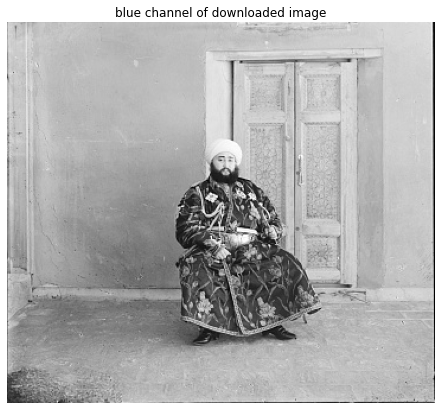

In [409]:
plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("blue channel of downloaded image")
plt.imshow(new_img_lst[2], cmap='gray')

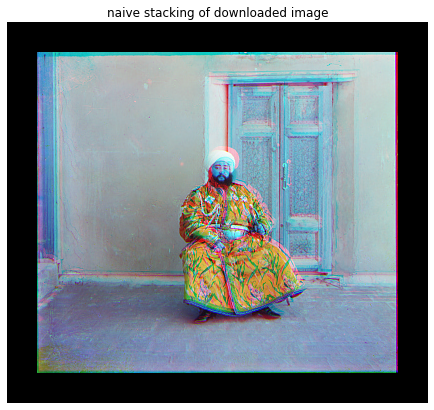

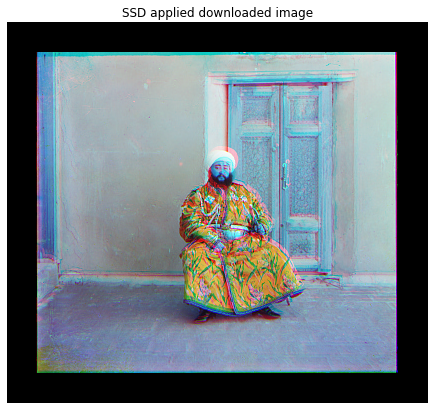

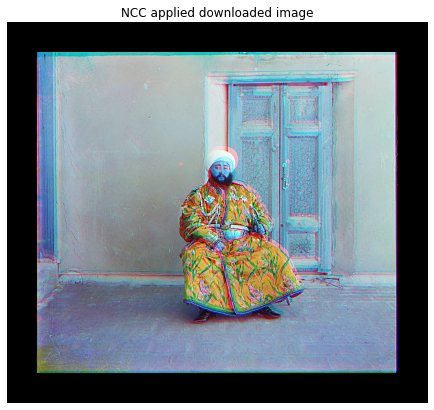

In [410]:
pad_img_lst = []
for img in new_img_lst:
    pad_img_lst.append(img_2d_pad(img,30))
    
color=naive_stacking(pad_img_lst)
plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("naive stacking of downloaded image")
plt.imshow(color)

ssd_align_lst = SSD(pad_img_lst,30)
color_ssd = naive_stacking(ssd_align_lst)

ncc_align_lst = NCC(pad_img_lst, 30)
color_ncc = naive_stacking(ncc_align_lst)

plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("SSD applied downloaded image")
plt.imshow(color_ssd)

plt.figure(figsize=(14,7))
plt.axis('off')
plt.title("NCC applied downloaded image")
plt.imshow(color_ncc)

Not sure why it didn't worked on the bonus image

# PROBLEM 2: Demosaicing Bayer patterns

## Naive demosaicing

Separately interpolate each color channel

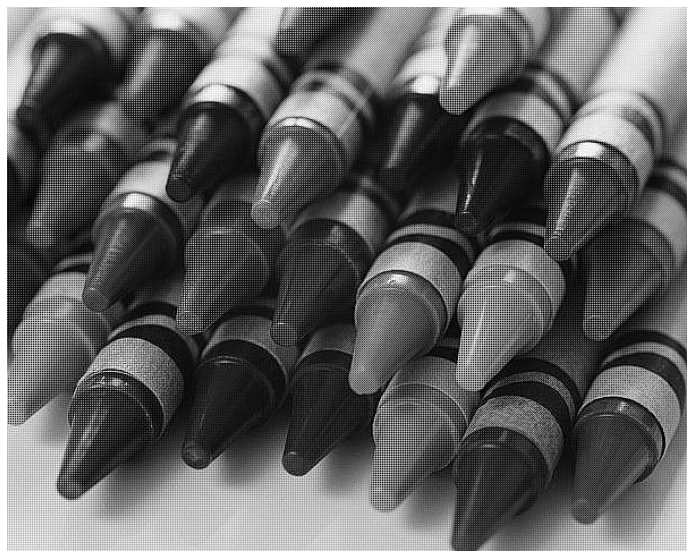

In [208]:
# we will work with this images, saved as a mosaic
# look at it first
image_path = 'images/crayons.bmp'

def read_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    return image

mosaic_img = read_image(image_path)

# Visualize the mosaic; you will notice the "checkerboard" pattern 
# (you may need to make the figure larger or smaller to see it clearly)
plt.figure(figsize=(20,10))
plt.axis('off')
plt.imshow(mosaic_img, cmap='gray')        

In [209]:
mosaic_img.shape

(480, 600)

In [212]:
red_map = np.zeros(mosaic_img.shape)
green_map = np.zeros(mosaic_img.shape)
blue_map = np.zeros(mosaic_img.shape)

In [213]:
for i in range(red_map.shape[0]):
    for j in range(red_map.shape[1]):
        if i%2 == 0:
            if j%2 == 0:
                red_map[i,j] = 1
            if j%2 ==1:
                green_map[i,j] = 1
        if i%2 == 1:
            if j%2 == 0:
                green_map[i,j] = 1
            if j%2 == 1:
                blue_map[i,j] =1


In [225]:
np.repeat(mosaic_img[:, :, np.newaxis], 3, axis=2).shape

(480, 600, 3)

In [238]:
image_map = naive_stacking([red_map,green_map,blue_map])
image_map = image_map*np.repeat(mosaic_img[:, :, np.newaxis], 3, axis=2)

In [221]:
new_image = np.zeros([mosaic_img.shape[0],mosaic_img.shape[1], 3])

In [352]:
for i in range(image_map.shape[0]):
    for j in range(image_map.shape[1]):
        claus = image_map[max(0,i-1):min(image_map.shape[0],i+2), max(0,j-1):min(image_map.shape[1],j+2)]
        if (claus[:,:,0] != 0).any():
            new_image[i,j,0] = claus[:,:,0][claus[:,:,0]!=0].mean()
        else:
            new_image[i,j,0] = 0
        if (claus[:,:,1] != 0).any():
            new_image[i,j,1] = claus[:,:,1][claus[:,:,1]!=0].mean()
        else:
            new_image[i,j,1] = 0
        if (claus[:,:,2] != 0).any():
            new_image[i,j,2] = claus[:,:,2][claus[:,:,2]!=0].mean()
        else:
            new_image[i,j,2] = 0
new_image = new_image/255

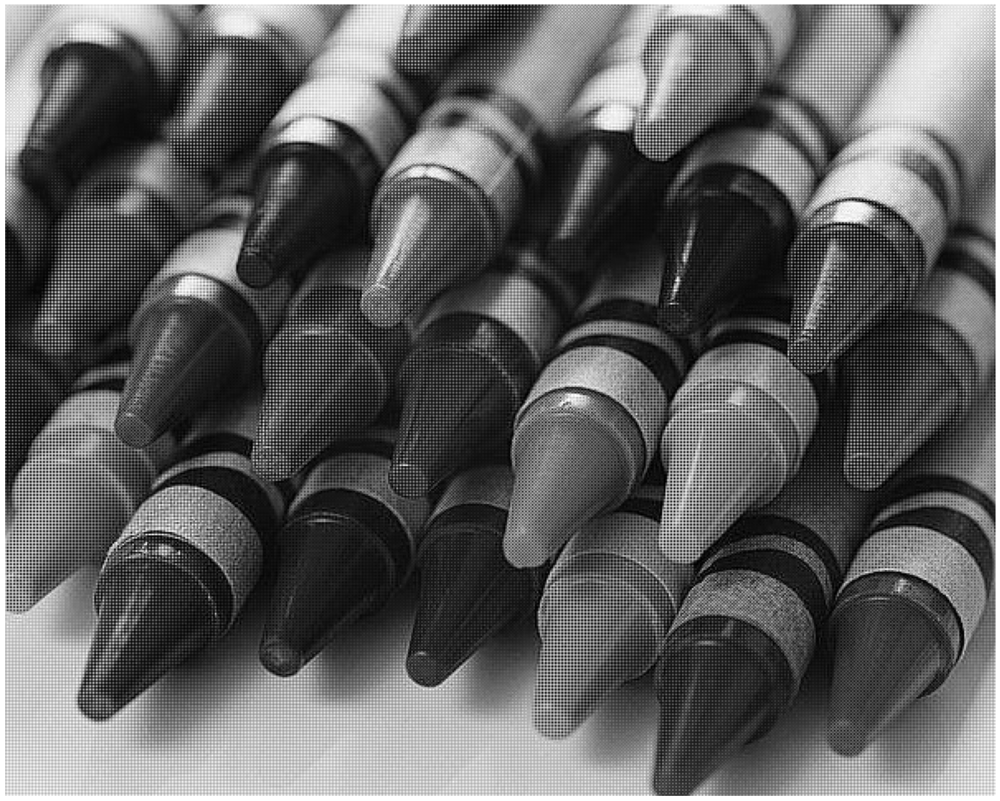

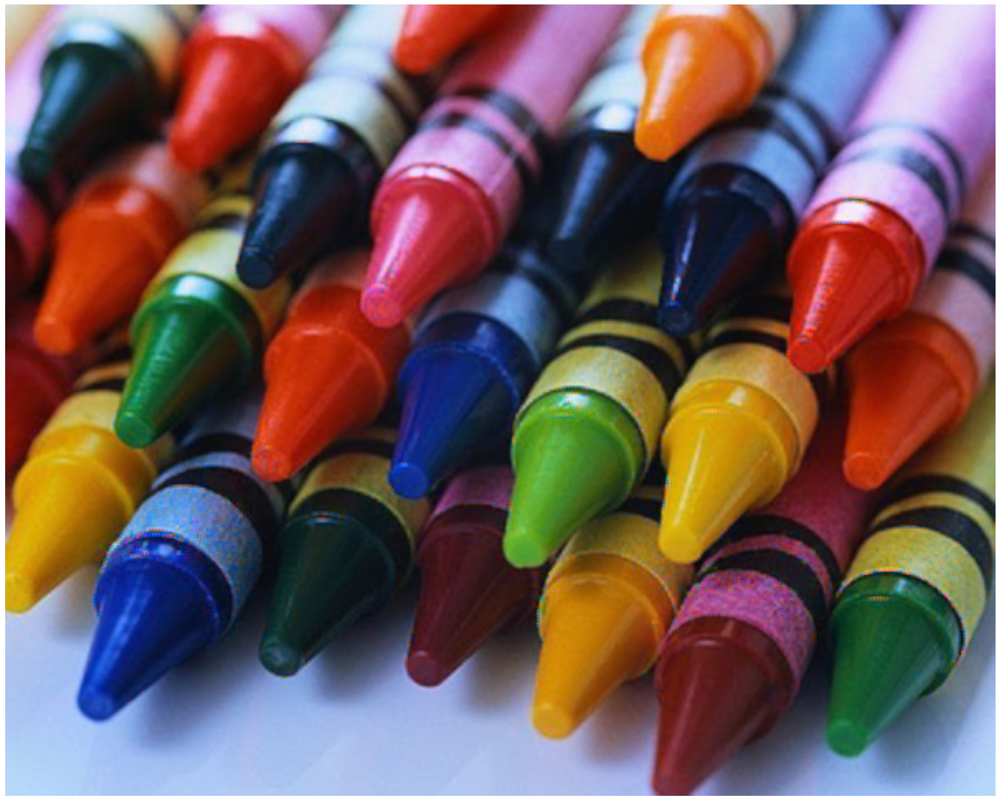

In [353]:
plt.figure(figsize=(24,30))
plt.axis('off')
plt.imshow(mosaic_img, cmap='gray')  

plt.figure(figsize=(24,30))
plt.axis('off')
plt.imshow(new_image)

## Freeman's Method

Tie the R and B channels to G, as described; take care to scale the color values (and then un-scale them) to make sure they have the same mean across channels.

In [361]:
mean_lst = new_image.mean(axis=(0,1))

In [363]:
normalized_new_img = new_image-mean_lst

In [358]:
r_g = normalized_new_img[:,:,0]-normalized_new_img[:,:,1]
b_g = normalized_new_img[:,:,2]-normalized_new_img[:,:,1]

In [313]:
import scipy.signal

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


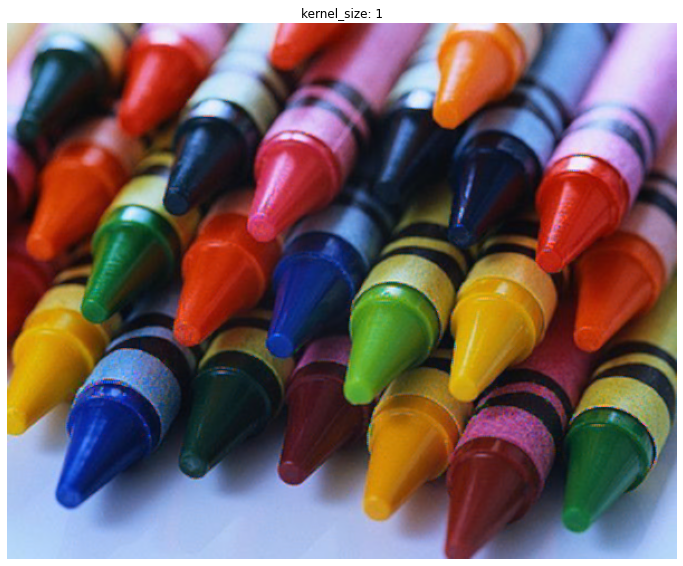

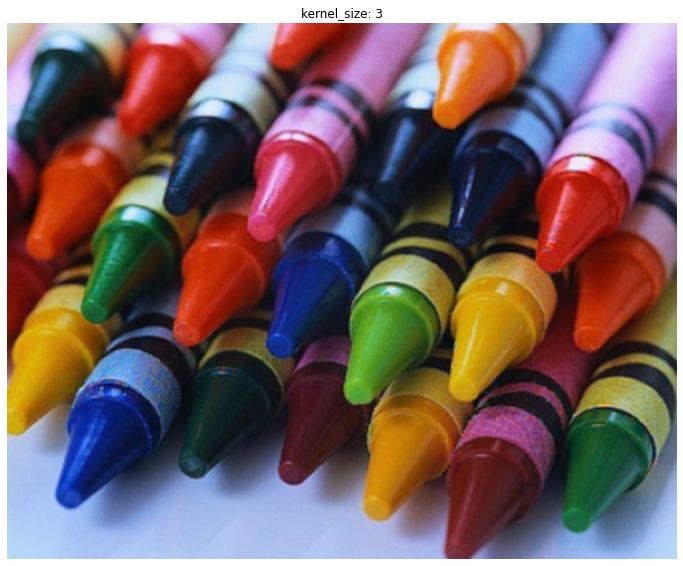

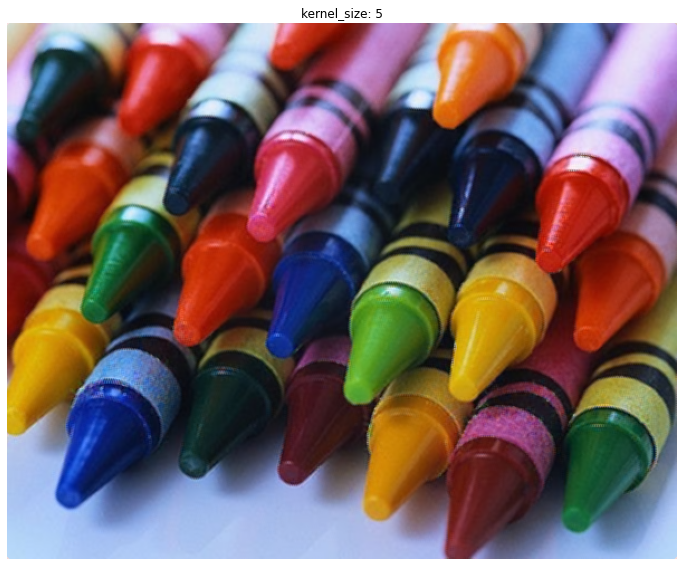

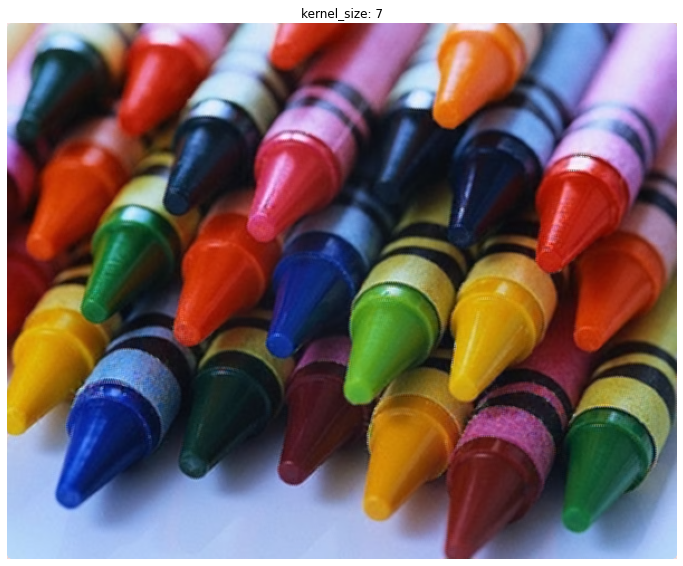

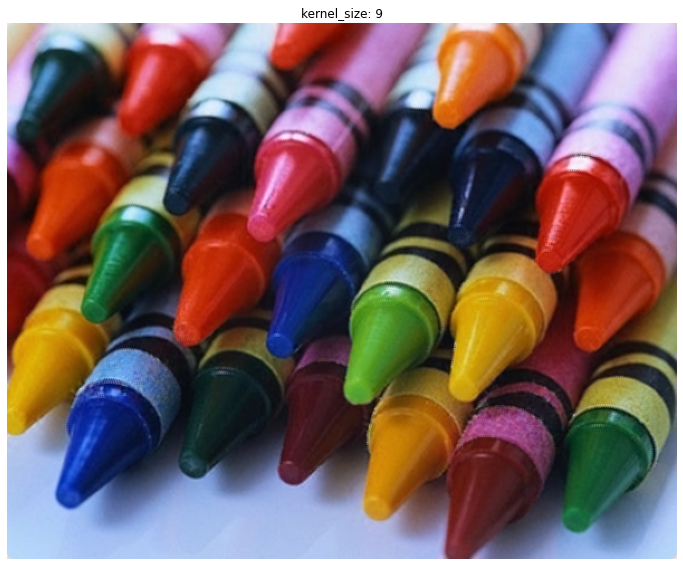

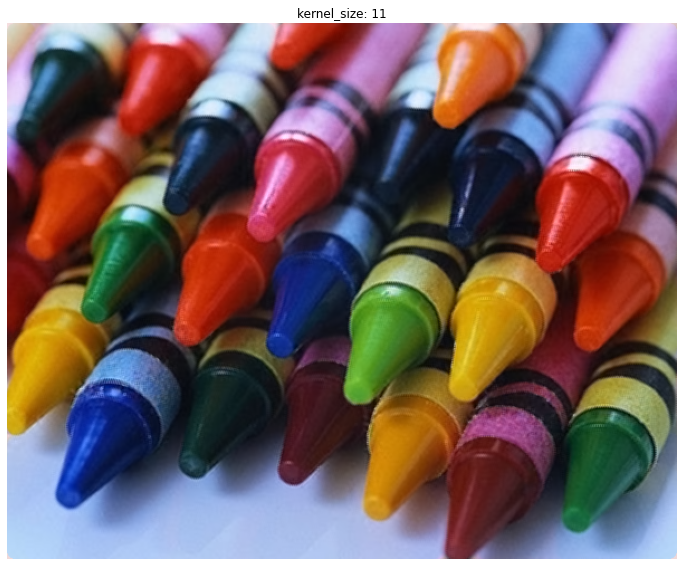

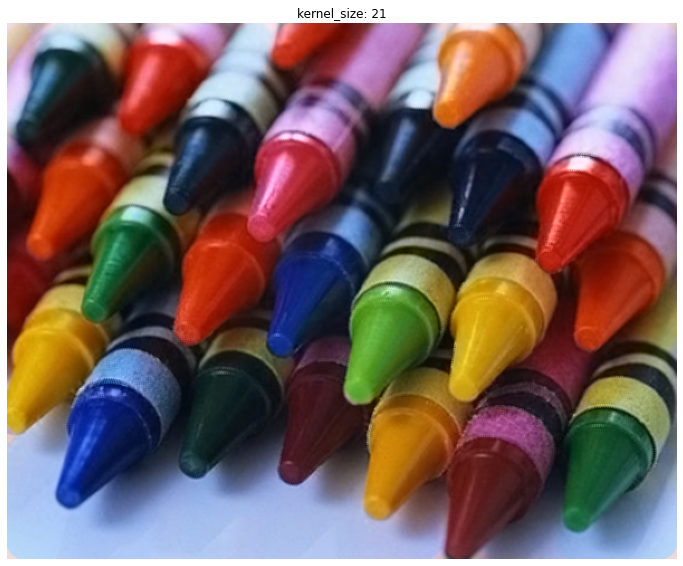

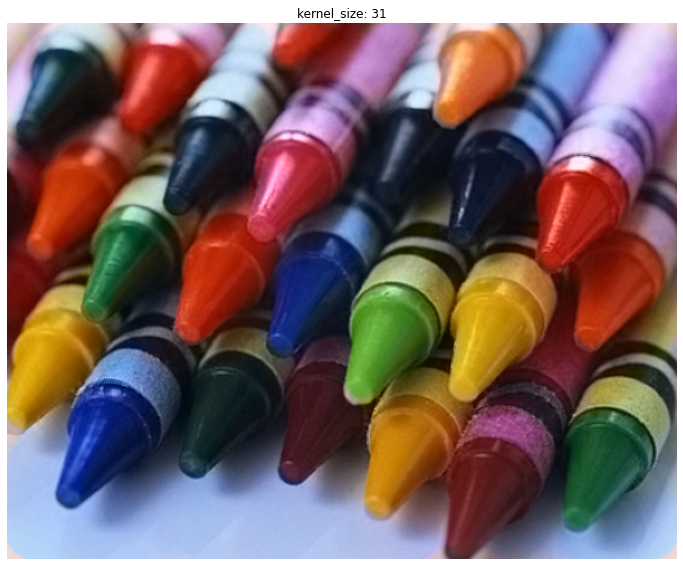

In [367]:
kernel_size_lst = [1,3,5,7,9,11,21,31]

for ksize in kernel_size_lst:
    r_g_filter = scipy.signal.medfilt2d(r_g, ksize)
    b_g_filter = scipy.signal.medfilt2d(b_g, ksize)
    g = normalized_new_img[:,:,1]
    r = g+r_g_filter
    b = g+b_g_filter
    stack_img = naive_stacking([r,g,b])
    unnormalized_img = stack_img+mean_lst
    plt.figure(figsize=(12,15))
    plt.axis('off')
    plt.title(f'kernel_size: {ksize}')
    plt.imshow(unnormalized_img)

The medianblur filter makes the image more blured and the larger the kernel size, the more the image is blurred. And as the image is blurred out, the noise in the image (unusual color) is also blurred out and able to reduce noise. However, when the kernel size is too large, it starts to see discoloration in the image. See left lower corner when kernel size is 31, the blue background becomes pink. I would pick kernel size = 5 as the image is still quite sharp and the noise is blurred out.